# **What is Pix2Pix GAN?**

**Pix2PixGAN** is a **GAN** architecture used for **Image to Image Transition**. It was first addressed in the [**2016 Paper**](https://arxiv.org/abs/1611.07004). The **main architecture** of the model is little different from the **normal conventional GANs** we have discussed earlier. 

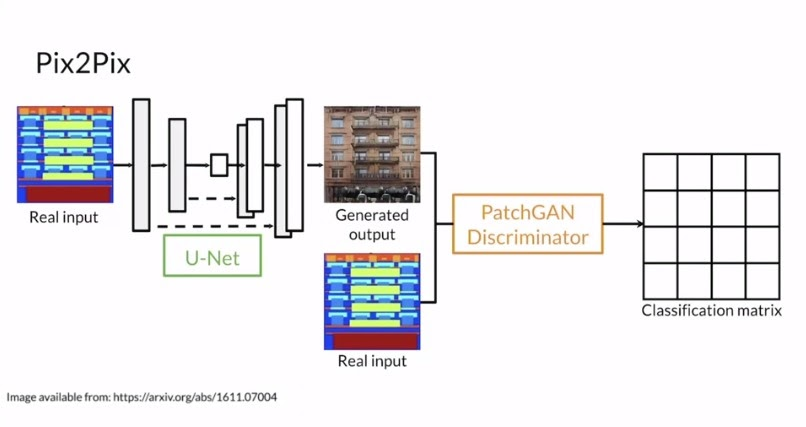

Let's look at the **Main differences** of **Pix2Pix GAN** $:$

* Till now, We uses a **Decoder network** for **image generations** but here the generator is an Updated Version of **UNet AutoEncoder**. **Autoencoders** are **very good** at generating maks, this indicates that they are also capable of generating fake realistic looking images. I guess the authors choosed **UNet** because it is one of the **lightest auto-encoder** but it gives **extremely good results**. Keep in mind the regular autoencoder architecture of UNet is a bit changed, as per the guidelines of training a **GAN**.

* One of the **major difference** is that now the **generator network** does not takes in noise but it takes in **real images** and performs a **domain transfer** to generate images of the target mask. **Domain transfer** is a field of research which works on producing models that can take in **image from one domain and produce image of other domain**. For example, in this case we take in **satellite images** and produce **map images**.

* The **Generator architecture** is also changed the **new architecture** is called **PatchGAN**. It is called **PatchGAN** because the outputs of the **discriminator** are not **zeros and ones** but **zeros of ones of a particular patch size**. In simple words, it is a **convolutional neural network** which outputs a feature of a **patch size** full of zeros or ones as per target labels.

* The input of **Discriminator** is also changed. The model takes in **two images** as inputs, one of the image is the **target image** and the other is the **generated image** the target of the model is to identify whether the **generated image is the mask image of the target image or not**. 

* The rest of the **training procedure** is the **same as the training** a regular **GAN** but there are 2 **loss functions**. The **Binary Crossentropy** loss for the **discriminator** and and extra **Mean Absolute Error(L1 Loss)** loss between the **generated image** and the **target image**, as a **loss function** for the **generator**. The The loss weight for **L1 loss** is **100x** of the **Binary cross entropy** loss. This is done, so that **generator** can focus on **producing images close to the target images**, where as the **discriminator** can focus on **discriminating those images**.

These are the theoratical points you need to keep in mind, let's code it.

# **Imports**

Below are the **modules** used in this **notebook**.

In [1]:
# Common
import os
import keras
import numpy as np
from tqdm import tqdm 
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array 

# Data Viz
import matplotlib.pyplot as plt

# Model
from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import ZeroPadding2D
from keras.layers import LeakyReLU
from keras.layers import concatenate
from keras.layers import Conv2DTranspose

from keras.initializers import RandomNormal
from keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential, Model, load_model

# Model Viz
from tensorflow.keras.utils import plot_model

# Model Losses
from keras.losses import BinaryCrossentropy

# **Data**

The **original image size** is **600 x 1200 pixels**. We need to first crop these to **600 by 600 pixels** for seperating the **Satellite and Maps images**. After that we will **resize the images** to **256 x 256 pixels**.

In [2]:
def load_data(path, trim=None):
    paths = sorted(glob(path + "*.jpg"))
    
    if trim is not None:
        paths = sorted(glob(path + "*.jpg"))[:trim]
        
    images = np.zeros(shape=(len(paths), 256, 256, 3))
    masks = np.zeros(shape=(len(paths), 256, 256, 3))
    
    for i,path in tqdm(enumerate(paths), desc="Data"):
        image = tf.cast(img_to_array(load_img(path)), tf.float32)
        img = image[:,:600,:]
        mask = image[:,600:,:]
        images[i] = tfi.resize(img,(256,256))/255.
        masks[i] = tfi.resize(mask,(256,256))/255.
    return images, masks

In [3]:
def show_image(image, title=None, alpha=1.0):
    plt.imshow(image, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, alpha=0.4, title=None):
    image = tf.squeeze(tf.cast(image, tf.float32))
    mask = tf.squeeze(tf.cast(mask, tf.float32))
    show_image(image)
    show_image(mask, alpha=alpha, title=title)

In [4]:
path = "../input/pix2pix-dataset/maps/maps/train/"
dataset = load_data(path, trim=1000)

Data: 1000it [00:29, 34.41it/s]


I **trimmed the data set**, this is because the **whole data set** was not Able to fit in the **RAM**.

In [5]:
BATCH_SIZE = 32
data = tf.data.Dataset.from_tensor_slices(dataset).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

The **original paper**, recommend using the **Batch size** of **1**, but I'm using **Batch size of 32** because it proved to be better for me. The **ultimate target** is that the model should be **trained** for the **full data** for **each epoch**, and that **ultimate goal is still preserved**.

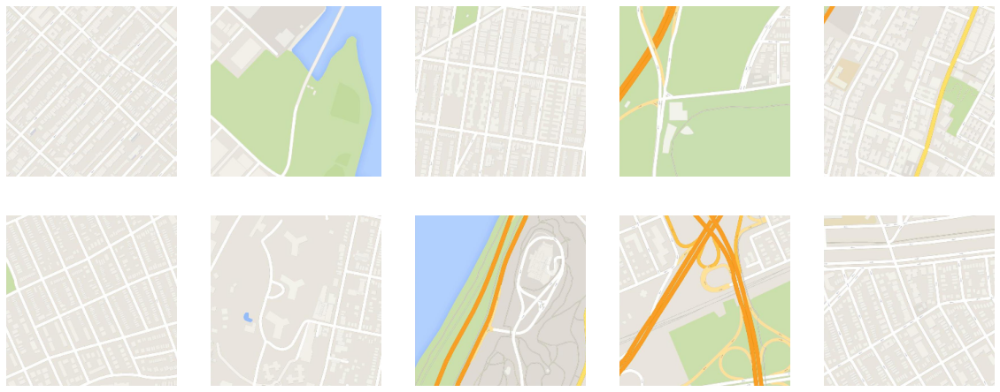

In [6]:
plt.figure(figsize=(20,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    for image, mask in data.take(1):
        show_image(mask[i])
plt.show()

# **Encoder**

In [7]:
def downsample(filters, size, batch_norm=True):
    
    layer = Sequential()
    layer.add(Conv2D(filters, kernel_size=size, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    if batch_norm:
        layer.add(BatchNormalization())
    layer.add(LeakyReLU())
    
    return layer

You can notice that there are **some major differences** from a regular **UNet network**.

* No MaxPooling Layer, layer is replaced by **Strides=2**. This is a **Global GAN Architecture guideline**.

* **LeakyReLU** activation is used.

All these changes are made by keeping in mind the **global guidelines** of creating a **GAN**. So if you are new to **GAN** you must see the **global guidelines**.

# **Decoder**

In [8]:
def upsample(filters, size, dropout=False):
    layer = Sequential()
    layer.add(Conv2DTranspose(filters, kernel_size=size, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    layer.add(BatchNormalization())
    if dropout:
        layer.add(Dropout(0.5))
    layer.add(ReLU())
    return layer

The **Decoder Network** is the same, the only difference is there are **no Conv2D Layers** after the **Upscalling**.

## **Generator**

In [9]:
def Generator():
    inputs = Input(shape=(256, 256, 3))
    down_stack = [
        downsample(64, 4, batch_norm=False), # (bs, 128,128,64)
        downsample(128, 4), # (bs, 64,64,128)
        downsample(256, 4), # (bs, 32,32,256)
        downsample(512, 4), # (bs, 16,16,512)
        downsample(512, 4), # (bs, 8,8,512)
        downsample(512, 4), # (bs, 4,4,512)
        downsample(512, 4), # (bs, 2,2,512)
        downsample(512, 4), # (bs, 1,1,512) 
    ]
    
    up_stack=[
        upsample(512, 4,dropout=True),
        upsample(512, 4,dropout=True),
        upsample(512, 4,dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]
    
    initializer = tf.random_normal_initializer(0.,0.02)
    last = Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh', kernel_initializer=initializer)
    
    
    x = inputs
    skips =[]
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concatenate([x, skip])
    
    x = last(x)
    return Model(inputs=inputs, outputs=x)

This is exactly like the **UNet**.

In [10]:
generator = Generator()
generator.summary()


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 64, 64, 128)  131584      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 32, 32, 256)  525312      sequential_1[0][0]               
______________________________________________________________________________________________

# **Discriminator**

In [11]:
def Discriminator():
    
    init = tf.random_normal_initializer(0.,0.02)
    
    inp = Input(shape=(256, 256, 3), name='input_image')
    tar = Input(shape=(256, 256, 3), name='target_image')
    
    x = concatenate([inp, tar])
    x = downsample(64, 4, batch_norm=False)(x)
    x = downsample(128, 4)(x)
    x = downsample(256, 4)(x)
    
    x = ZeroPadding2D()(x)
    x = Conv2D(512, 4, strides=1, kernel_initializer=init, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = ZeroPadding2D()(x)
    
    x = Conv2D(1, 4, kernel_initializer=init)(x)
    return Model(inputs=[inp, tar], outputs=[x])

The **Decoder** is simillar to the **Normal CNN Classifer Network** but this time a small change is done by using the **ZeroPadding layer**. You can also used the Normal Architecture.

In [12]:
discriminator = Discriminator()
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_15 (Sequential)      (None, 128, 128, 64) 6144        concatenate_7[0][0]        

# **Pix2Pix GAN Training**

In [13]:
loss_object = BinaryCrossentropy(from_logits=True)
generator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)

These **hyperparameters** are taken from the **original paper**.

In [14]:
def generator_loss(disc_generated_output, gen_output, target):
    
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    
    
    # Mean Absolute Error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output)) 
    
    
    total_gen_loss = gan_loss + (100 * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

Multiplying the **mean absolute error(L1 Loss)** loss by **100**, forces the model to **produce more realistic images**, and this is **ultimately good for us**.

In [15]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    gen_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_loss = real_loss + gen_loss
    return total_loss

In [16]:
@tf.function()
def train_step(input_image, target_image, epoch):
    input_image, target_image = tf.cast(input_image, tf.float32), tf.cast(target_image, tf.float32)
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        
        dis_real_output = discriminator([input_image, target_image], training=True)
        dis_gen_output = discriminator([input_image, gen_output], training=True)        
        
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(dis_gen_output, gen_output, target_image)
        dis_loss = discriminator_loss(dis_real_output, dis_gen_output)
        
    generator_grads = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_grads = disc_tape.gradient(dis_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(generator_grads, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_grads, discriminator.trainable_variables))

In [17]:
def fit(train_ds, epoch):
    for i in tqdm(range(epoch), desc='Epoch'):        
        # train
        for n,(input_image, target_image) in train_ds.enumerate():
            train_step(input_image, target_image, i)

In [18]:
def show_predictions(image, mask):
    pred_out = generator.predict(image)[0]
    mask = mask[0]
    image = image[0]
    
    plt.figure(figsize=(8,5))
    
    plt.subplot(1,2,1)
    show_image(mask, title="Original Mask")
    
    plt.subplot(1,2,2)
    show_image(pred_out, title="Predicted Mask")
    
    plt.tight_layout()

Epoch: 100%|██████████| 20/20 [06:27<00:00, 19.36s/it]


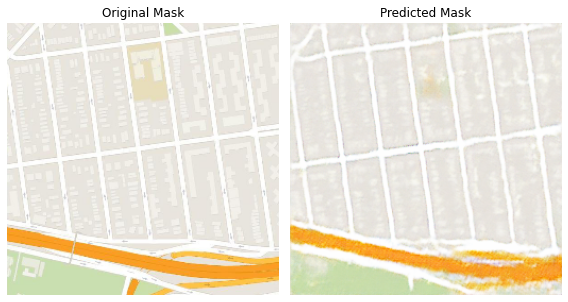

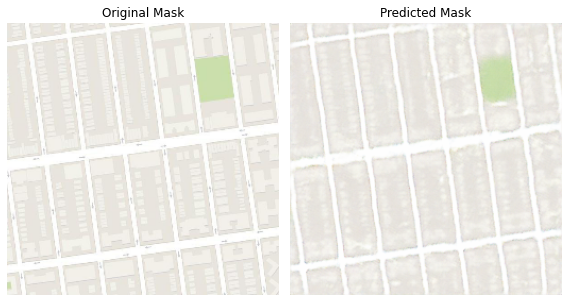

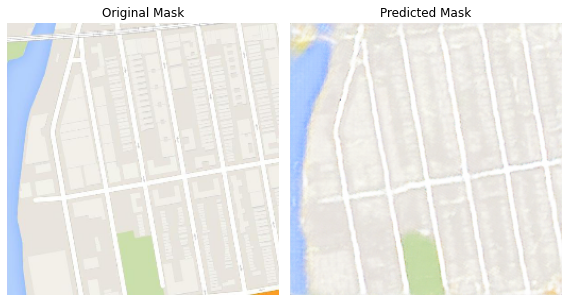

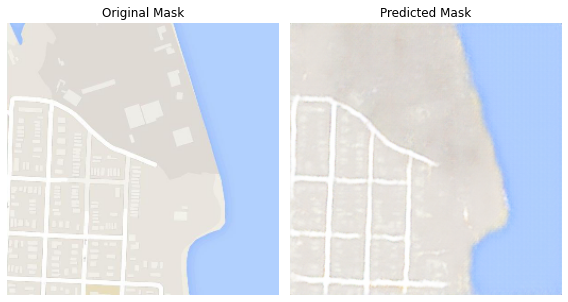

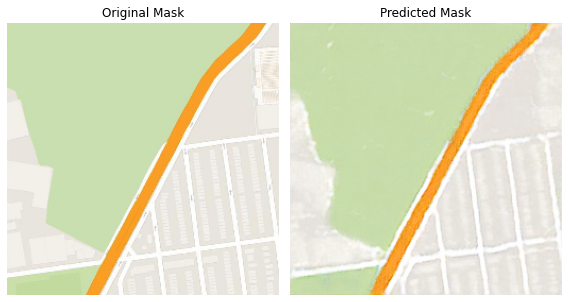

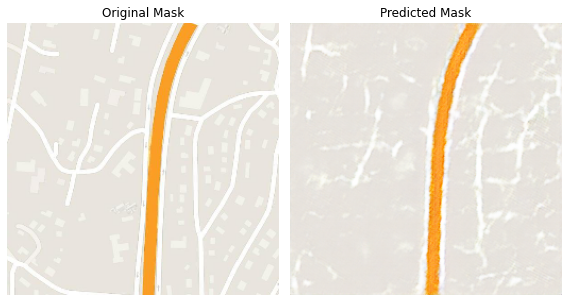

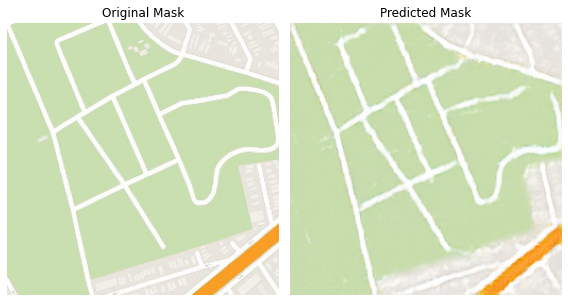

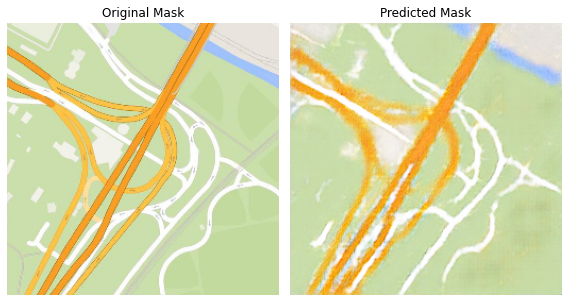

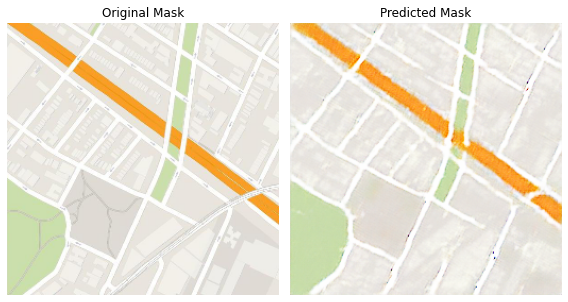

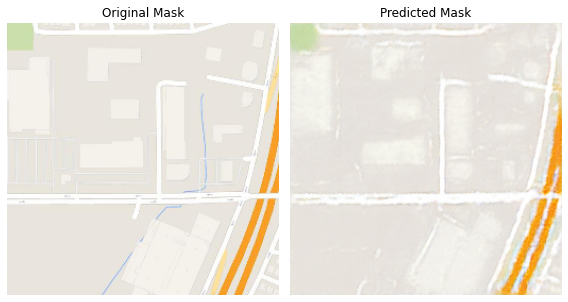

In [26]:
fit(data, 20)
n_images = 10
for image, mask in data.take(n_images):
    show_predictions(image, mask)
    plt.show()

Epoch: 100%|██████████| 20/20 [05:30<00:00, 16.53s/it]


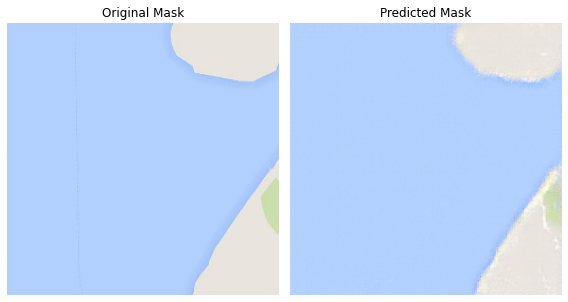

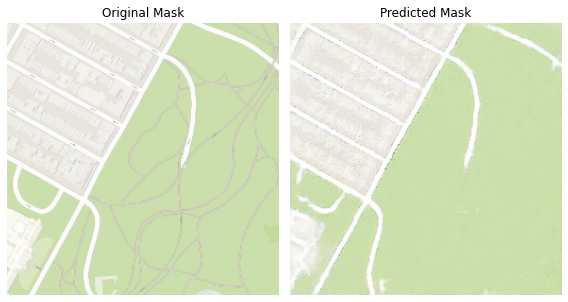

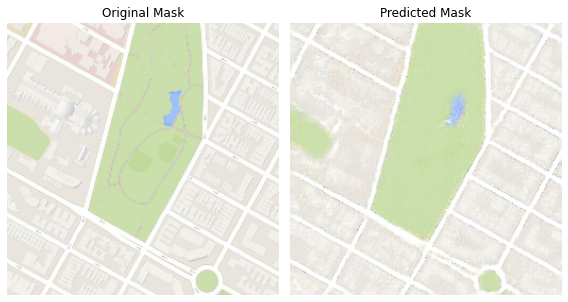

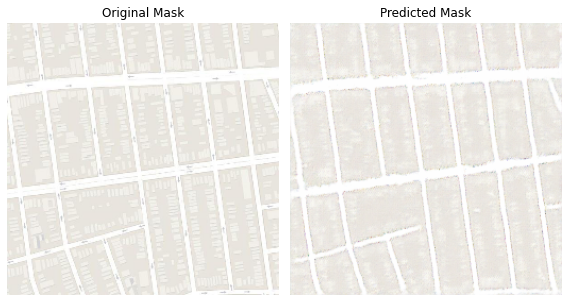

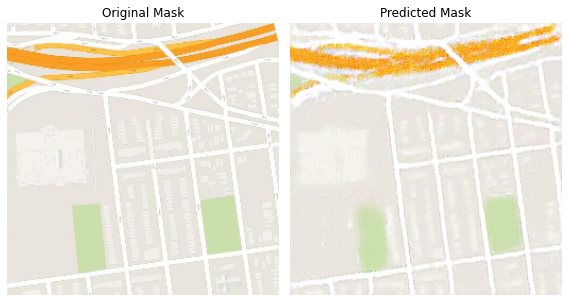

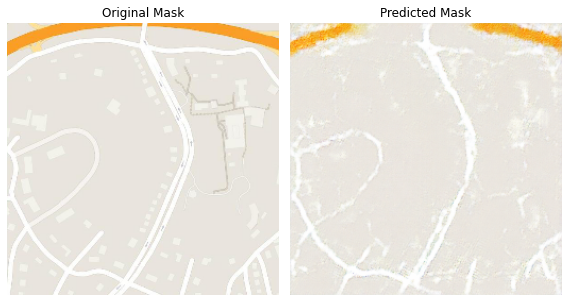

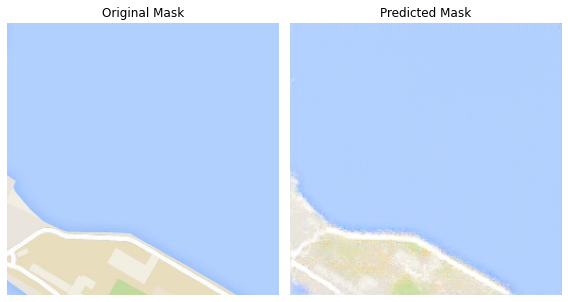

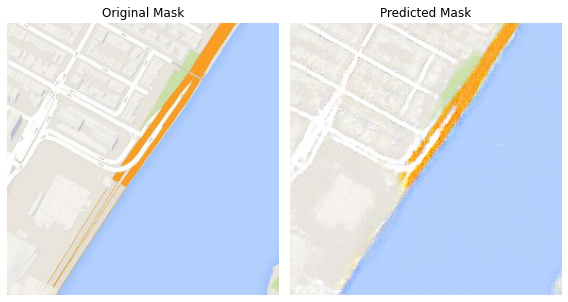

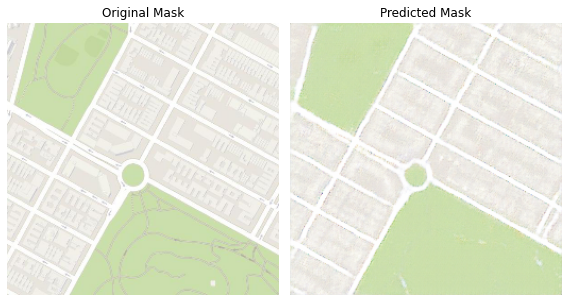

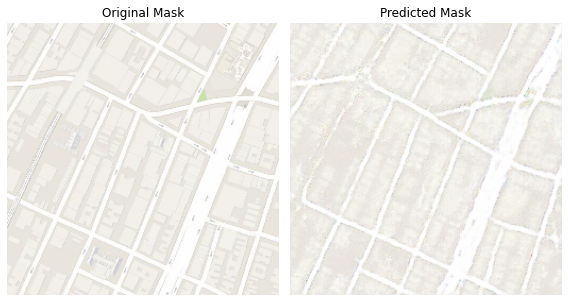

In [27]:
fit(data, 20)
n_images = 10
for image, mask in data.take(n_images):
    show_predictions(image, mask)
    plt.show()

Epoch: 100%|██████████| 20/20 [05:30<00:00, 16.51s/it]


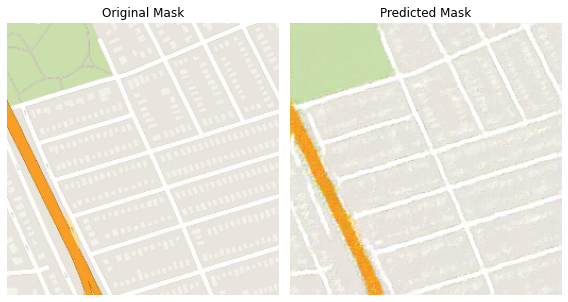

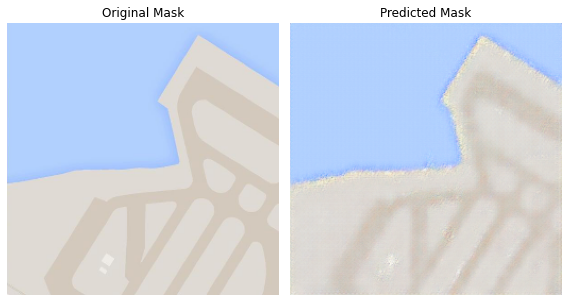

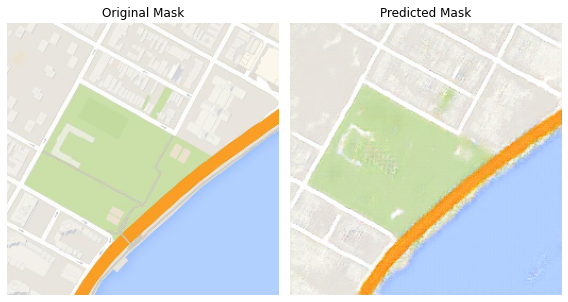

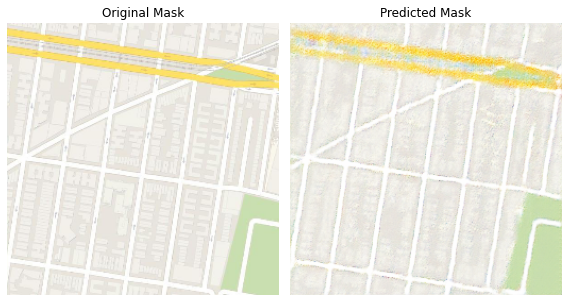

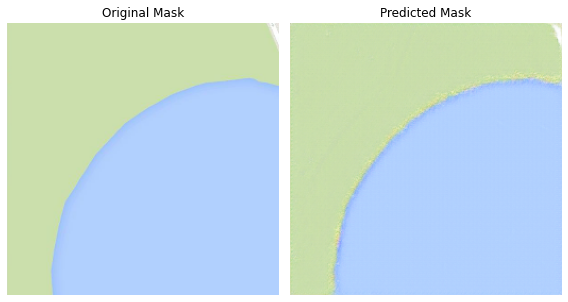

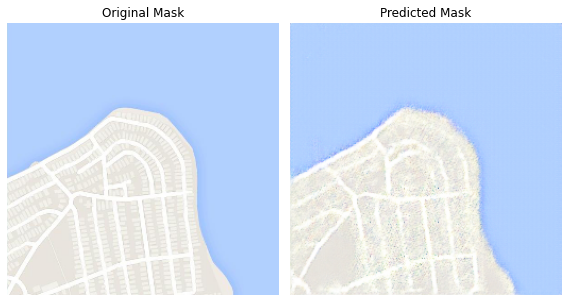

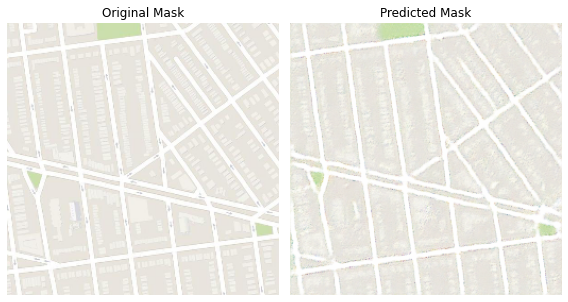

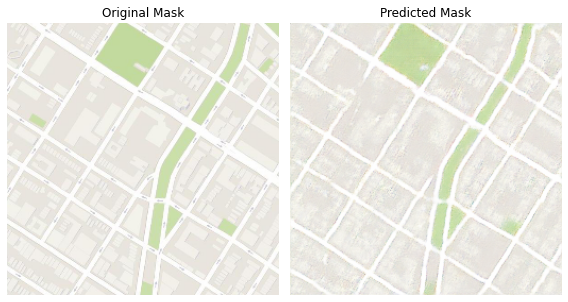

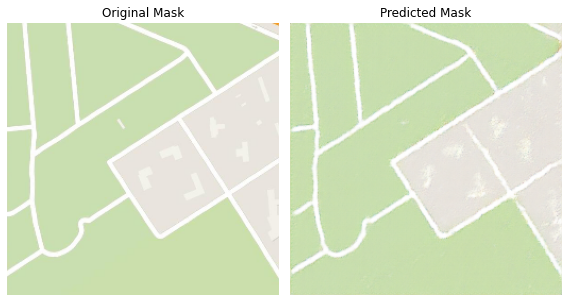

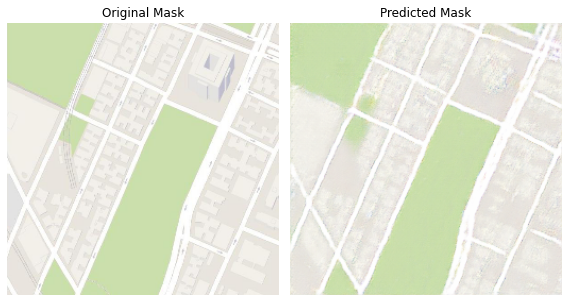

In [29]:
fit(data, 20)
n_images = 10
for image, mask in data.take(n_images):
    show_predictions(image, mask)
    plt.show()

Epoch: 100%|██████████| 20/20 [05:30<00:00, 16.53s/it]


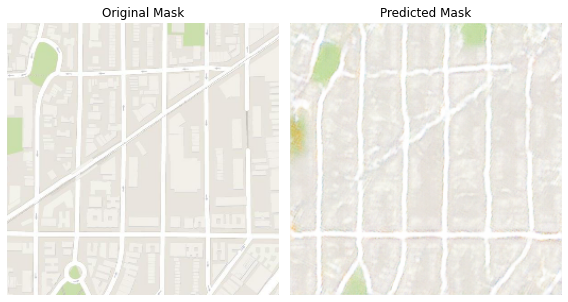

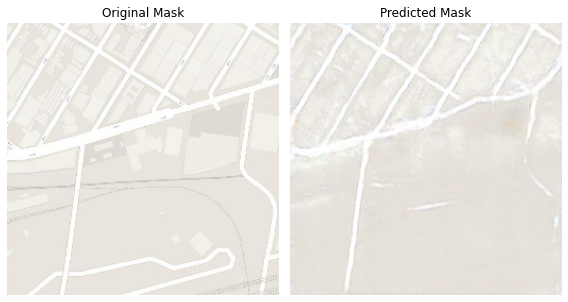

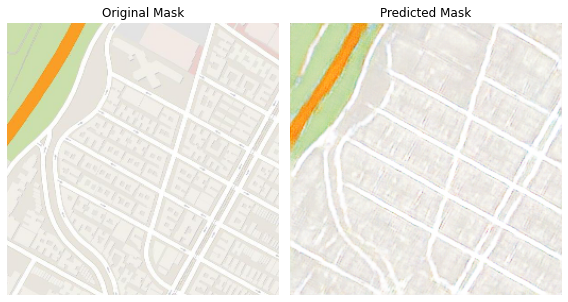

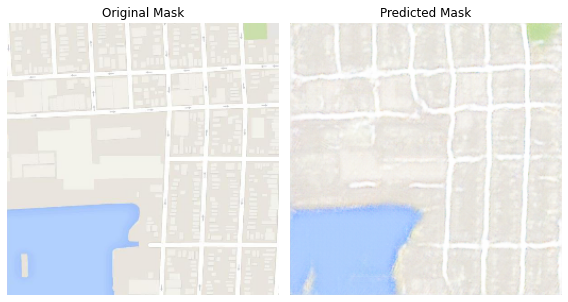

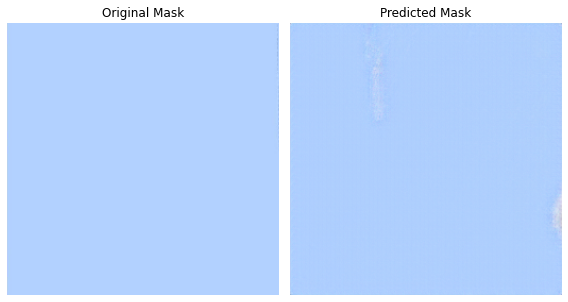

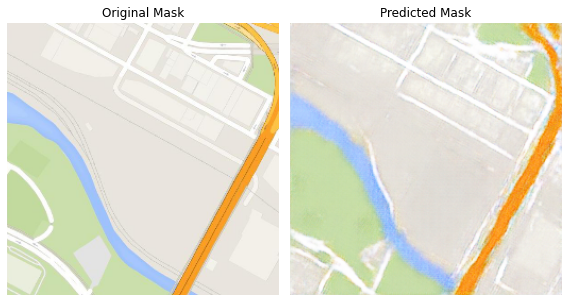

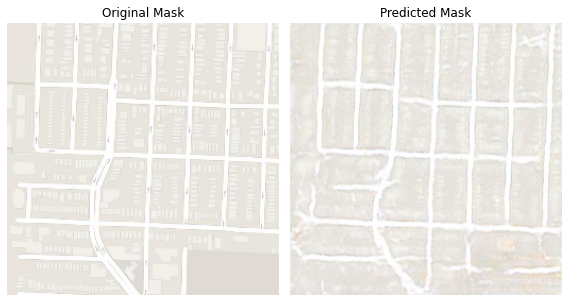

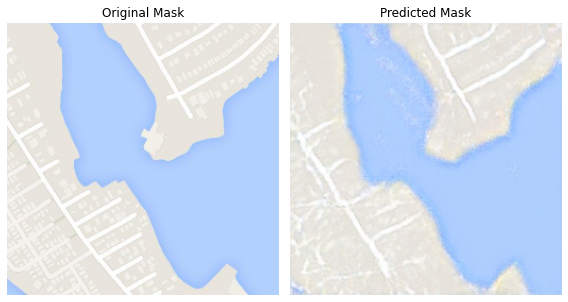

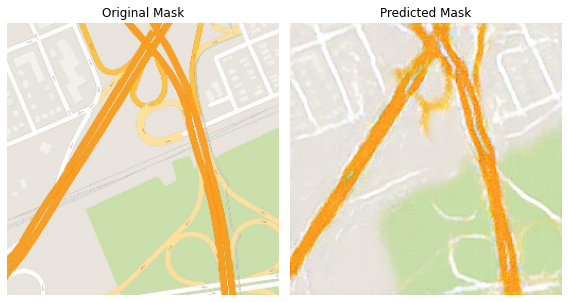

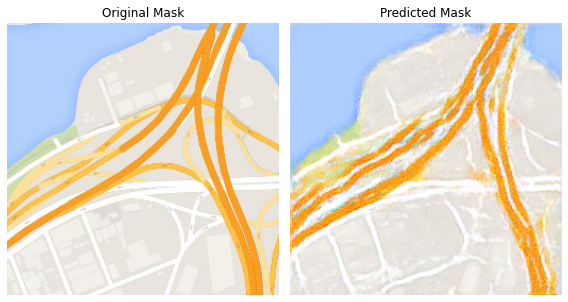

In [32]:
fit(data, 20)
n_images = 10
for image, mask in data.take(n_images):
    show_predictions(image, mask)
    plt.show()

Epoch: 100%|██████████| 20/20 [05:30<00:00, 16.53s/it]


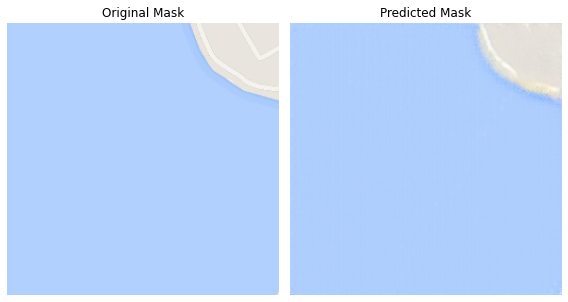

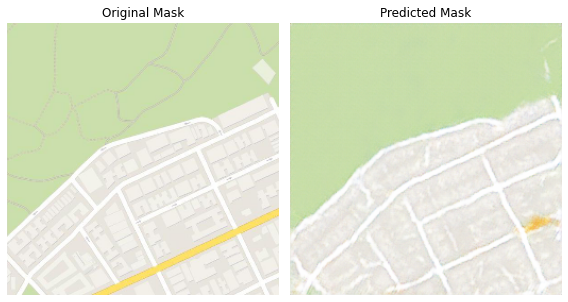

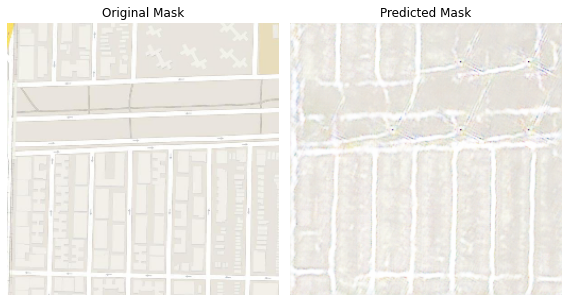

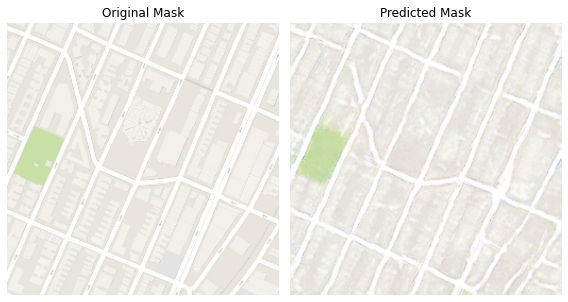

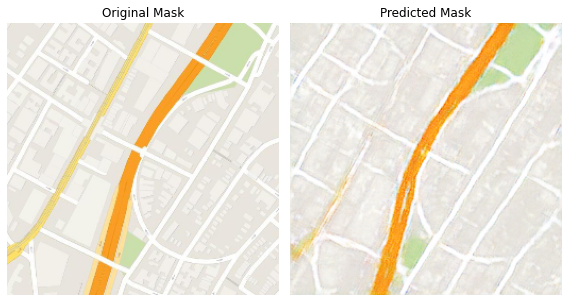

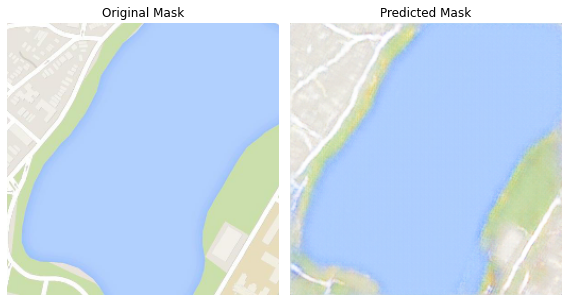

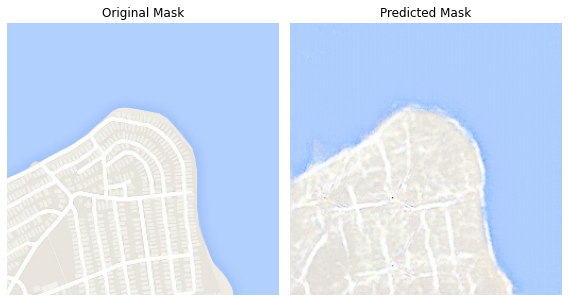

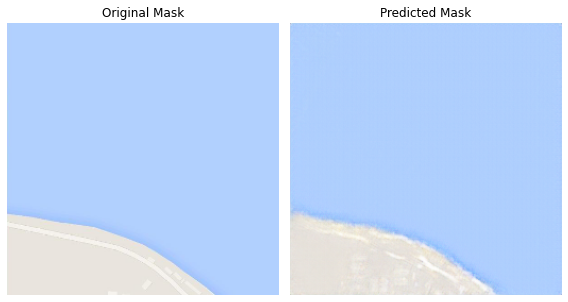

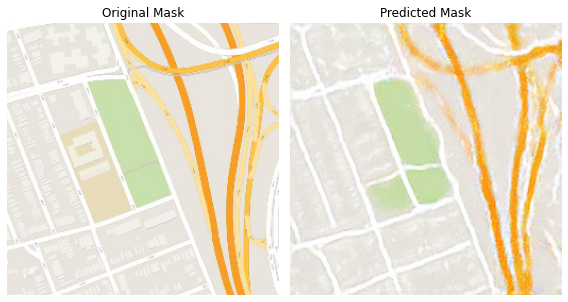

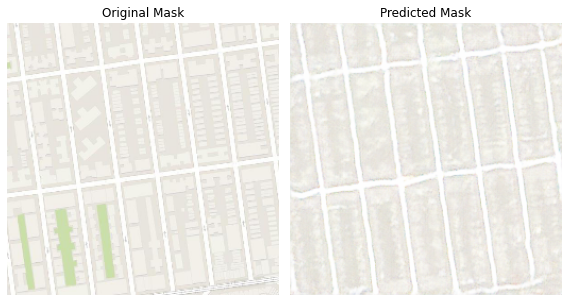

In [33]:
fit(data, 20)
n_images = 10
for image, mask in data.take(n_images):
    show_predictions(image, mask)
    plt.show()

In total the training was done for **100 Epochs** in chunks of **20 x 5**. This was done to have a control at the model performance and prevent it from getting worse. After **100 Epochs**, the model started to get worse. As you can notice, I haven't used any matrices, I trusted is my eyes.

In [34]:
generator = load_model('../input/pix2pixganmapgeneration/Pix2PixMapGenerator.h5')

# **Evaluating**

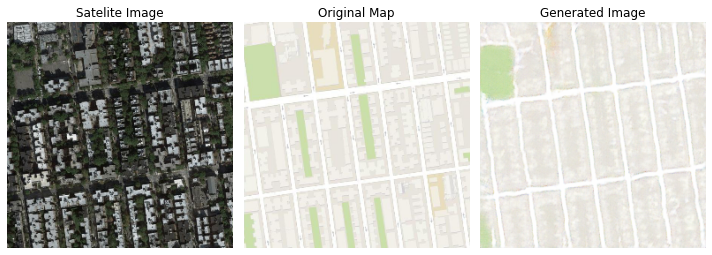

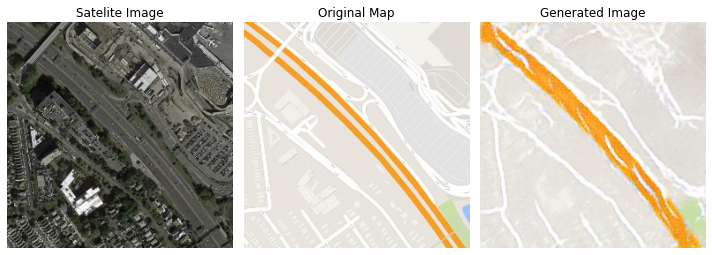

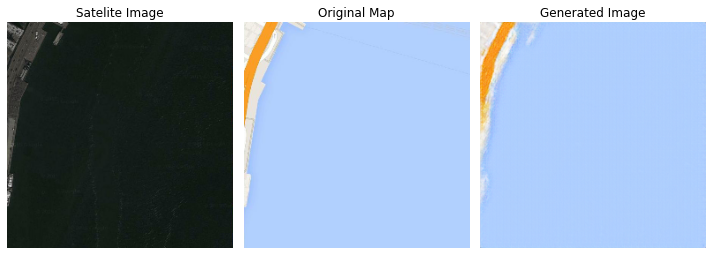

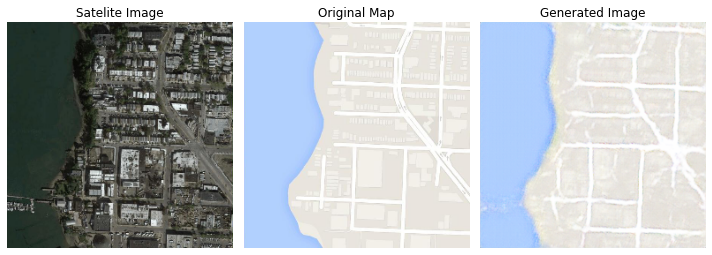

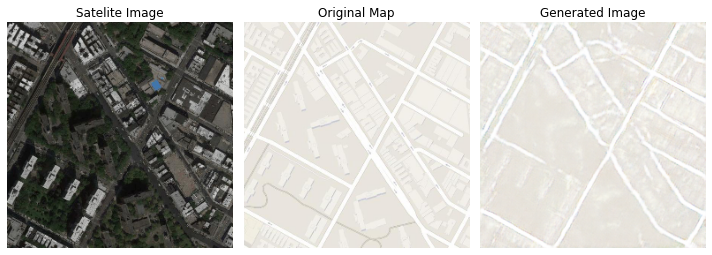

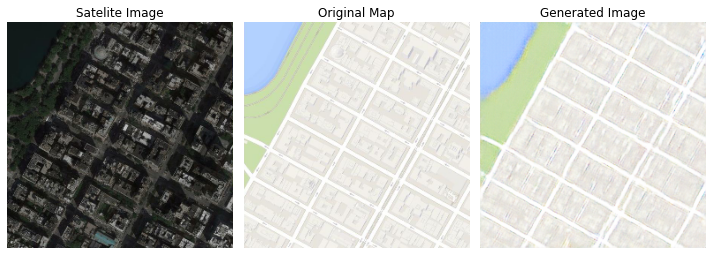

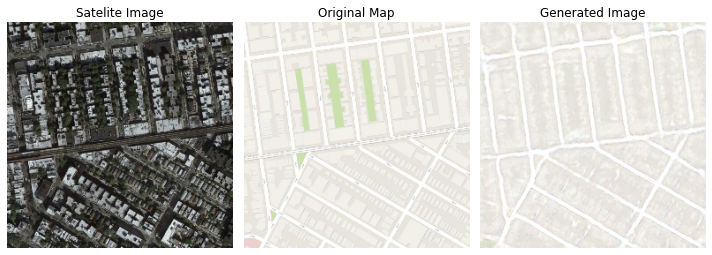

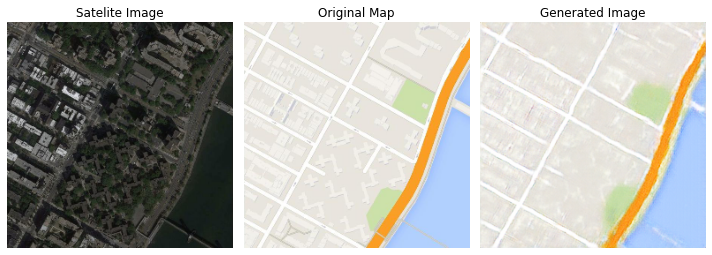

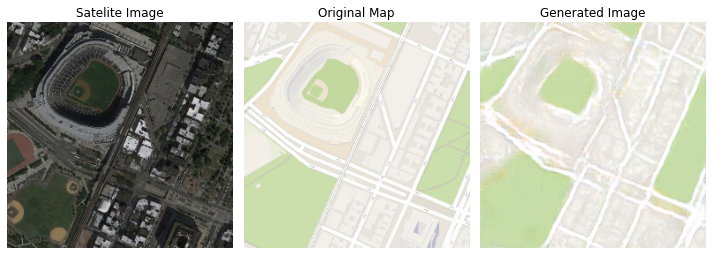

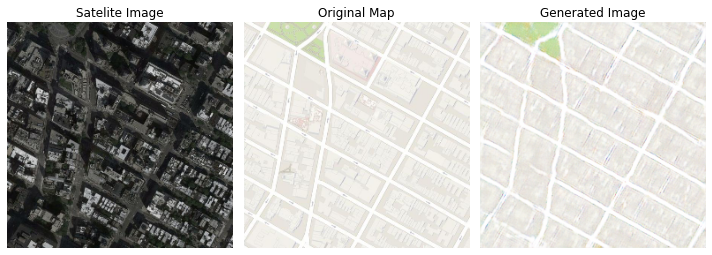

In [35]:
for i in range(10):
    for images, maps in data.take(1):
        plt.figure(figsize=(10,8))
    
        plt.subplot(1,3,1)
        id = np.random.randint(len(images))
        image = images[id]
        true_map = maps[id]
        pred_map = generator.predict(tf.expand_dims(image, axis=0))[0]
        show_image(image, title="Satelite Image")
        
        plt.subplot(1,3,2)
        show_image(true_map, title="Original Map")
        
        plt.subplot(1,3,3)
        show_image(pred_map, title="Generated Image")
        
        plt.tight_layout()
        plt.show()